# Real estate price predictor
Study based on a dataset from GitHub

In [2]:
import os
import tarfile
import urllib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 400

In [3]:
DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml2/master/"
HOUSING_PATH = os.path.join('datasets', 'housing')
HOUSING_URL = DOWNLOAD_ROOT + "datasets/housing/housing.tgz"

In [4]:
# create function that create a directory and extract the data
def fetch_housing_data(housing_url=HOUSING_URL, housing_path=HOUSING_PATH):
    os.makedirs(housing_path, exist_ok=True)
    tgz_path = os.path.join(housing_path, 'housing.tgz')
    urllib.request.urlretrieve(housing_url, tgz_path)
    housing_tgz = tarfile.open(tgz_path)
    housing_tgz.extractall(path=housing_path)
    housing_tgz.close()

In [5]:
# function that return a dataframe with all data
def load_housing_data(housing_path=HOUSING_PATH):
    csv_path = os.path.join(housing_path, 'housing.csv')
    return pd.read_csv(csv_path)

In [6]:
# execute functions and load dataframe in 'df' variable
fetch_housing_data()
df = load_housing_data()
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [8]:
# as can be noticed above, 'total_bedrooms' has less non-null count if compared with all other characteristics
# and 'ocean_proximity' is a characteristic with object type
df['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [9]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


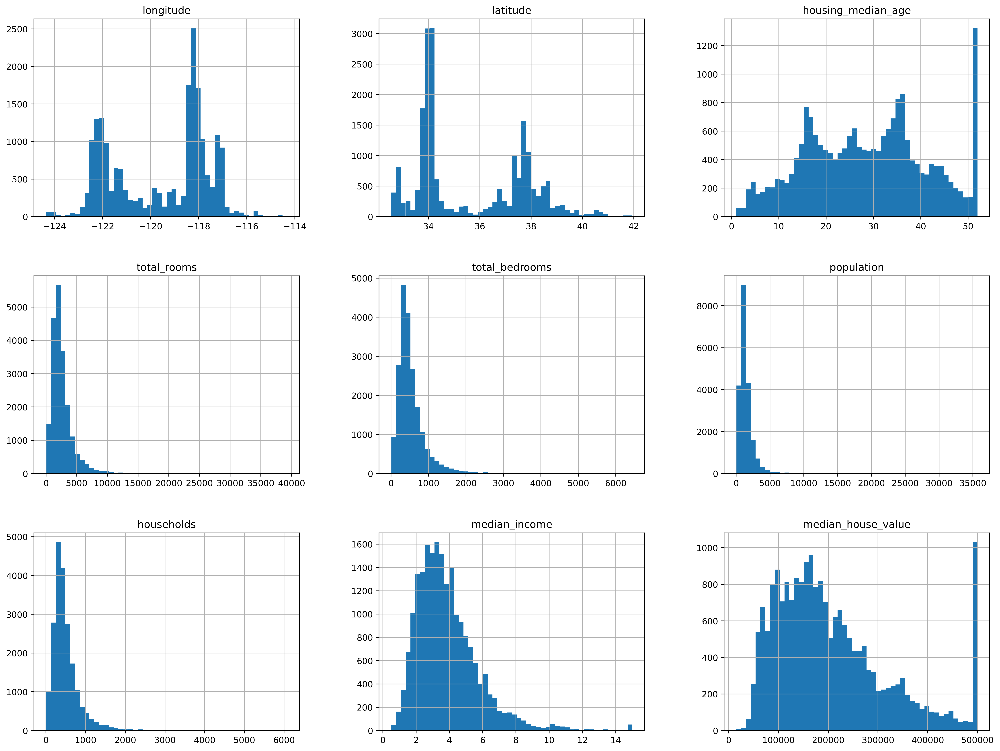

In [10]:
df.hist(bins=50, figsize=(20, 15))
plt.show()

In [11]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(df, test_size=0.2, random_state=42)
print(len(train_set))
print(len(test_set))

16512
4128


<Axes: >

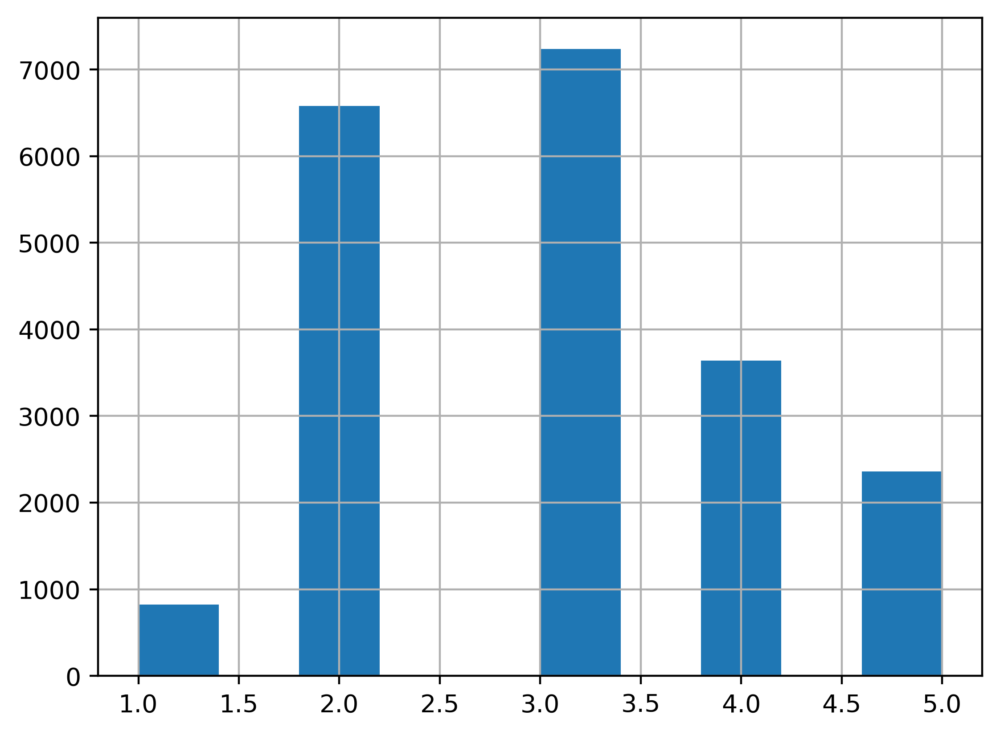

In [12]:
# create an income category to represent the data in a better way (only 5 categories)
df['income_cat'] = pd.cut(df['median_income'],
                              bins=[0, 1.5, 3.0, 4.5, 6.0, np.inf],
                              labels=[1, 2, 3, 4, 5])

df['income_cat'].hist()

In [13]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in split.split(df, df['income_cat']):
    strat_train_set = df.loc[train_index]
    strat_test_set = df.loc[test_index]
    
strat_test_set['income_cat'].value_counts() / len(strat_test_set)

3    0.350533
2    0.318798
4    0.176357
5    0.114341
1    0.039971
Name: income_cat, dtype: float64

It can be seen that the proportions of the test set is very similar to the proportion of the whole characteristic, as shown in the histogram above.  
After that, 'income_cat' will be erased.
This is typically done because the 'income_cat' column was only temporarily added for the purpose of creating a stratified split, and it is not a feature that the machine learning model needs to be aware of during training or testing.

In [14]:
# remove 'income_cat' attribute
for set_ in (strat_train_set, strat_test_set):
    set_.drop('income_cat', axis=1, inplace=True)

In [15]:
# create a deepcopy to ensure the original data will not be affected
from copy import deepcopy

housing = deepcopy(strat_train_set)

<Axes: xlabel='longitude', ylabel='latitude'>

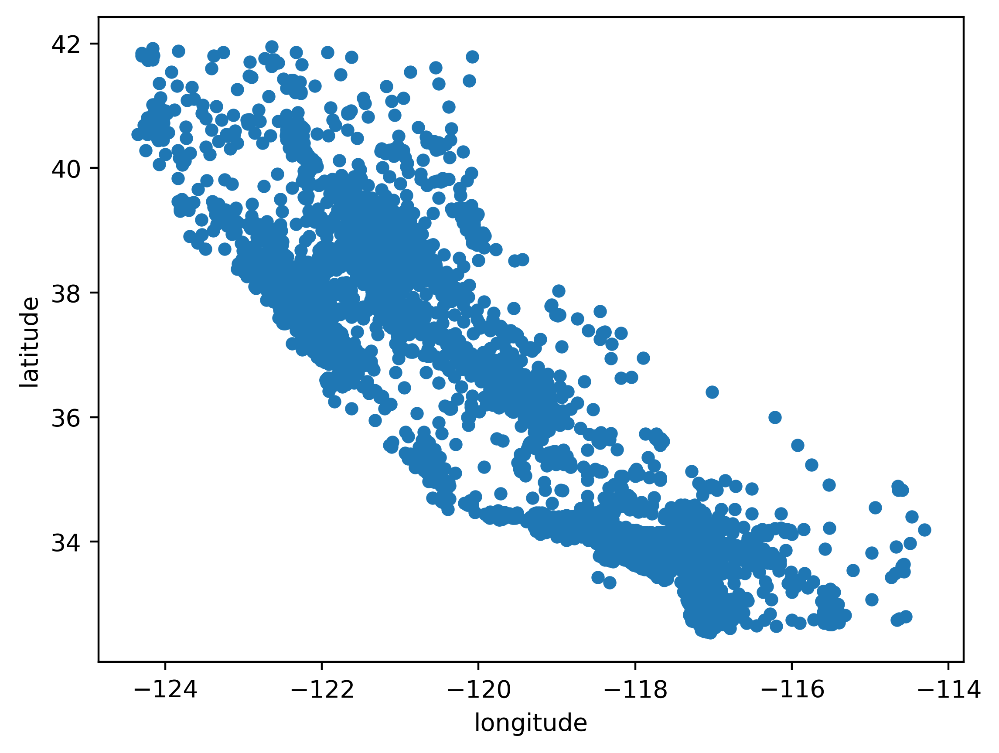

In [16]:
# exploring train data
housing.plot(kind='scatter', x='longitude', y='latitude')

<Axes: xlabel='longitude', ylabel='latitude'>

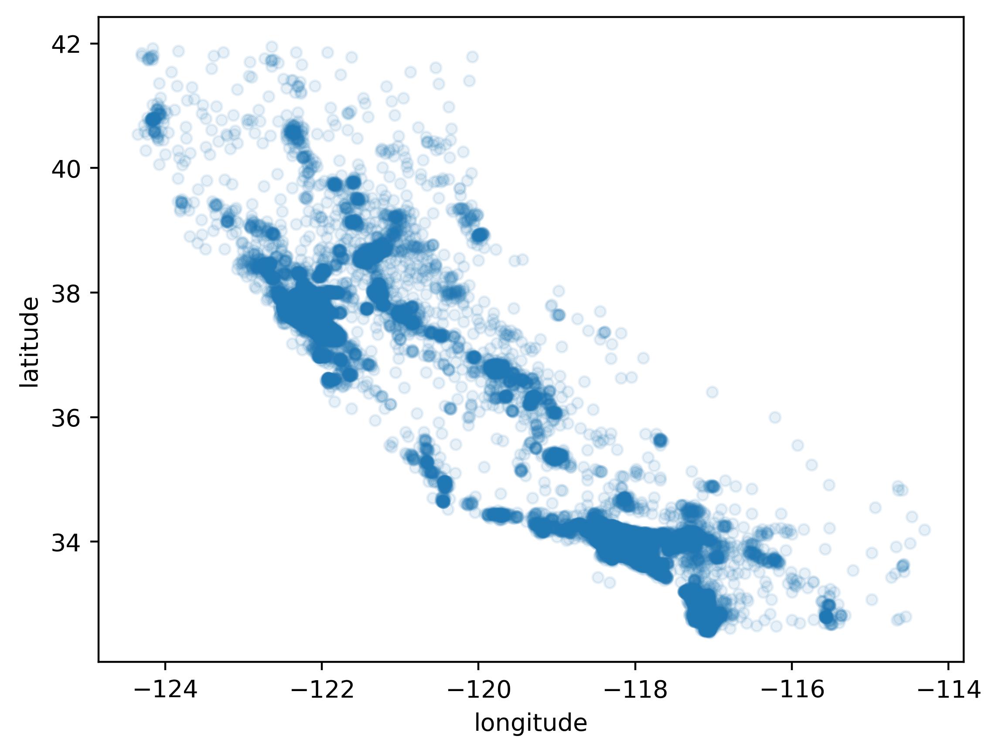

In [17]:
# change alpha to see high and low densities
housing.plot(kind='scatter', x='longitude', y='latitude', alpha=0.1)

<Axes: xlabel='longitude', ylabel='latitude'>

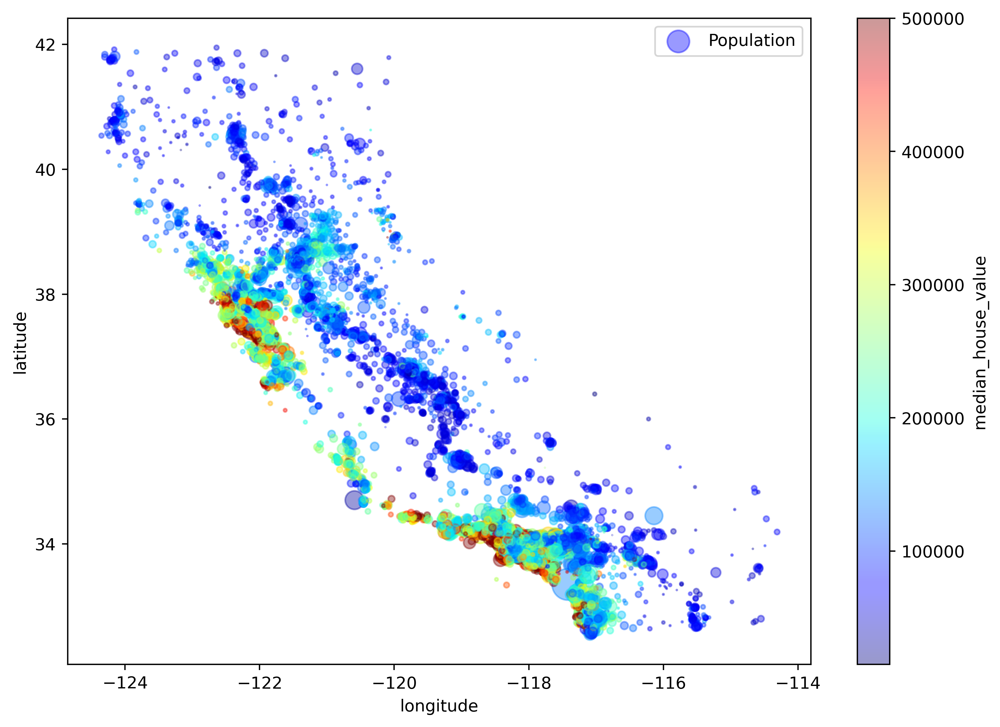

In [18]:
housing.plot(kind='scatter', x='longitude', y='latitude', alpha=0.4,
            s=housing['population']/100, label='Population', figsize=(10, 7),
            c='median_house_value', cmap=plt.get_cmap("jet"), colorbar=True)

In [19]:
# searching for LINEAR correlations
corr_matrix = housing.corr(numeric_only=True)

corr_matrix['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.687151
total_rooms           0.135140
housing_median_age    0.114146
households            0.064590
total_bedrooms        0.047781
population           -0.026882
longitude            -0.047466
latitude             -0.142673
Name: median_house_value, dtype: float64

array([[<Axes: xlabel='median_house_value', ylabel='median_house_value'>,
        <Axes: xlabel='median_income', ylabel='median_house_value'>,
        <Axes: xlabel='total_rooms', ylabel='median_house_value'>,
        <Axes: xlabel='housing_median_age', ylabel='median_house_value'>],
       [<Axes: xlabel='median_house_value', ylabel='median_income'>,
        <Axes: xlabel='median_income', ylabel='median_income'>,
        <Axes: xlabel='total_rooms', ylabel='median_income'>,
        <Axes: xlabel='housing_median_age', ylabel='median_income'>],
       [<Axes: xlabel='median_house_value', ylabel='total_rooms'>,
        <Axes: xlabel='median_income', ylabel='total_rooms'>,
        <Axes: xlabel='total_rooms', ylabel='total_rooms'>,
        <Axes: xlabel='housing_median_age', ylabel='total_rooms'>],
       [<Axes: xlabel='median_house_value', ylabel='housing_median_age'>,
        <Axes: xlabel='median_income', ylabel='housing_median_age'>,
        <Axes: xlabel='total_rooms', ylabel='housi

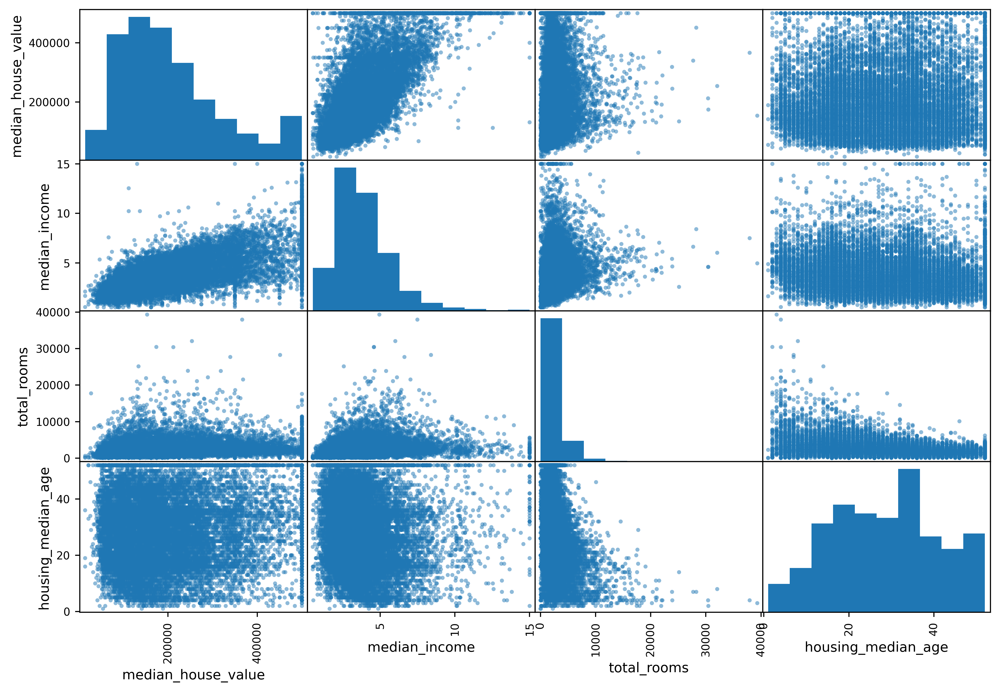

In [20]:
from pandas.plotting import scatter_matrix
# plotting the attributes with greater linear corrrelation
attributes = ['median_house_value', 'median_income', 'total_rooms', 'housing_median_age']
scatter_matrix(housing[attributes], figsize=(12, 8))

<Axes: xlabel='median_income', ylabel='median_house_value'>

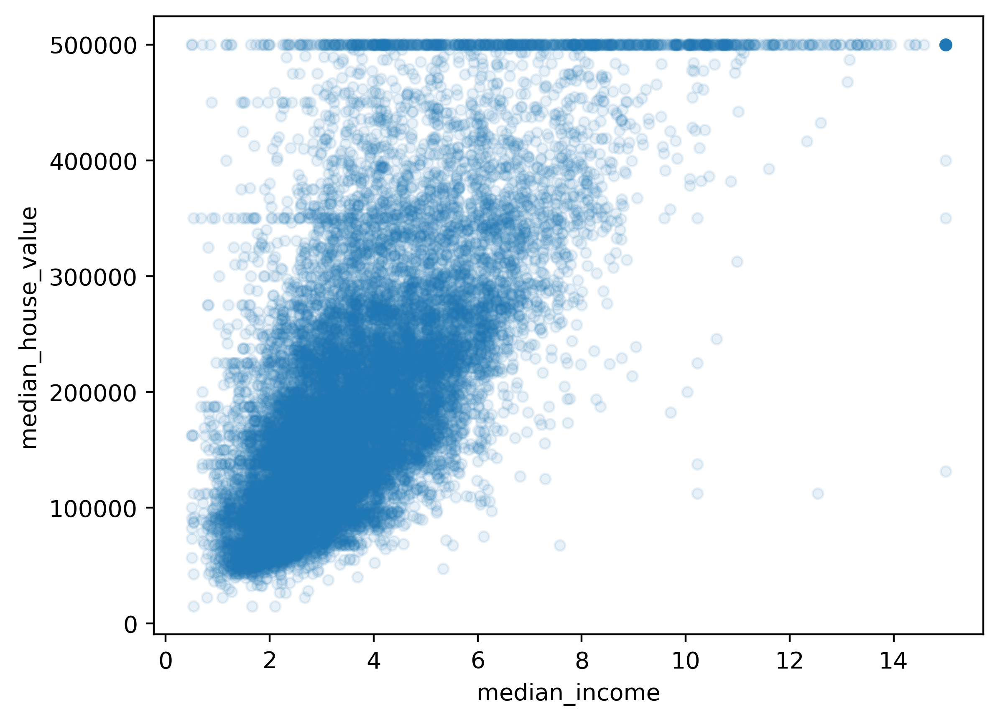

In [21]:
# the most correlated attribute to "median_house_value" is "median_income"
# plot that correlation
housing.plot(kind='scatter', x='median_income', y='median_house_value', alpha=0.1)

### Creating some extra attributes to combine characteristics

In [22]:
housing['rooms_per_household'] = housing['total_rooms'] / housing['households']
housing['bedrooms_per_room'] = housing['total_bedrooms'] / housing['total_rooms']
housing['population_per_household'] = housing['population'] / housing['households']

In [23]:
corr_matrix = housing.corr(numeric_only=True)
corr_matrix['median_house_value'].sort_values(ascending=False)

median_house_value          1.000000
median_income               0.687151
rooms_per_household         0.146255
total_rooms                 0.135140
housing_median_age          0.114146
households                  0.064590
total_bedrooms              0.047781
population_per_household   -0.021991
population                 -0.026882
longitude                  -0.047466
latitude                   -0.142673
bedrooms_per_room          -0.259952
Name: median_house_value, dtype: float64

## Preparing data to ML algorithms

In [24]:
housing = strat_train_set.drop('median_house_value', axis=1)
housing_labels = deepcopy(strat_train_set['median_house_value'])

Only "total_bedrooms" have missing values, so there are some options:  
- Drop the values that are not complete;
- Drop the entire feature;
- Define those missing values as the mode, mean, etc.

In [25]:
"""housing.dropna(subset=['total_bedrooms']) # option 1
housing.drop('total_bedrooms', axis=1) # option 2
# option 3:
median = housing['total_bedrooms'].median()
housing['total_bedrooms'].fillna(median_inplace=True)
"""

"housing.dropna(subset=['total_bedrooms']) # option 1\nhousing.drop('total_bedrooms', axis=1) # option 2\n# option 3:\nmedian = housing['total_bedrooms'].median()\nhousing['total_bedrooms'].fillna(median_inplace=True)\n"

In [26]:
# using sklearn library to impute the median
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')

In [27]:
# create a copy of "housing" with only numeric type
housing_num = housing.drop('ocean_proximity', axis=1)
imputer.fit(housing_num)

SimpleImputer(strategy='median')

In [28]:
# comparing the original with the calculated data
print(imputer.statistics_)
print(housing_num.median().values)

[-118.51      34.26      29.      2119.       433.      1164.
  408.         3.54155]
[-118.51      34.26      29.      2119.       433.      1164.
  408.         3.54155]


In [29]:
X = imputer.transform(housing_num)

In [30]:
housing_tr = pd.DataFrame(X, columns=housing_num.columns,
                         index=housing_num.index)

In [31]:
housing_cat = housing[['ocean_proximity']]
print(housing_cat.value_counts())
housing_cat.head(10)

ocean_proximity
<1H OCEAN          7277
INLAND             5262
NEAR OCEAN         2124
NEAR BAY           1847
ISLAND                2
dtype: int64


,ocean_proximity
12655,INLAND
15502,NEAR OCEAN
2908,INLAND
14053,NEAR OCEAN
20496,<1H OCEAN
1481,NEAR BAY
18125,<1H OCEAN
5830,<1H OCEAN
17989,<1H OCEAN
4861,<1H OCEAN


It can be seen that "ocean_proximity" is a categorical variable, with 5 different categories.  
ML algorithms are better with numerical values, so this feature will be transformed.

In [32]:
from sklearn.preprocessing import OrdinalEncoder

ordinal_encoder = OrdinalEncoder()
housing_cat_encoded = ordinal_encoder.fit_transform(housing_cat)
print(housing_cat_encoded[:10])
print(ordinal_encoder.categories_)

[[1.]
 [4.]
 [1.]
 [4.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]]
[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
      dtype=object)]


In [33]:
# create one-hot encoding for the "ocean_proximity" attribute
from sklearn.preprocessing import OneHotEncoder

cat_encoder = OneHotEncoder()
housing_cat_ohe = cat_encoder.fit_transform(housing_cat)
housing_cat_ohe

<16512x5 sparse matrix of type '<class 'numpy.float64'>'
	with 16512 stored elements in Compressed Sparse Row format>

In [34]:
print(cat_encoder.categories_)
print(housing_cat_ohe.toarray())

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
      dtype=object)]
[[0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]
 ...
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]]


In [35]:
# building a customized transformer
from sklearn.base import BaseEstimator, TransformerMixin

rooms_ix, bedrooms_ix, population_ix, households_ix = 3, 4, 5, 6

class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_bedrooms_per_room=True):
        self.add_bedrooms_per_room = add_bedrooms_per_room
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        rooms_per_household = X[:, rooms_ix] / X[:, households_ix]
        population_per_household = X[:, population_ix] / X[:, households_ix]
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X[:, bedrooms_ix] / X[:, rooms_ix]
            return np.c_[X, rooms_per_household, population_per_household, bedrooms_per_room]
        else:
            return np.c_[X, rooms_per_household, population_per_household]

attr_adder = CombinedAttributesAdder(add_bedrooms_per_room=False)
housing_extra_attribs = attr_adder.transform(housing.values)

In [36]:
# pipeline for the numeric attributes
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('attribs_adder', CombinedAttributesAdder()),
    ('std_scaler', StandardScaler())
])

housing_num_tr = num_pipeline.fit_transform(housing_num)

In [37]:
from sklearn.compose import ColumnTransformer

num_attribs = list(housing_num)
cat_attribs = ['ocean_proximity']
full_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_attribs),
    ('cat', OneHotEncoder(), cat_attribs)
])

housing_prepared = full_pipeline.fit_transform(housing)

In [38]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(housing_prepared, housing_labels)

LinearRegression()

In [39]:
# predict small part of the data
some_data = housing.iloc[:5]
some_labels = housing_labels.iloc[:5]
some_data_prepared = full_pipeline.transform(some_data)
print('Predictions', lr.predict(some_data_prepared))
print('Labels', list(some_labels))

Predictions [ 85657.90192014 305492.60737488 152056.46122456 186095.70946094
 244550.67966089]
Labels [72100.0, 279600.0, 82700.0, 112500.0, 238300.0]


In [40]:
# checking some metrics of the model
from sklearn.metrics import mean_squared_error

housing_predictions = lr.predict(housing_prepared)
lr_mse = mean_squared_error(housing_labels, housing_predictions)
lr_rmse = np.sqrt(lr_mse)
lr_rmse

68627.87390018745

As shown above, the linear regression model has a predictive error of $68,628.  
Now, a decision tree will be tested.

In [41]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(housing_prepared, housing_labels)

DecisionTreeRegressor()

In [42]:
housing_predictions = tree_reg.predict(housing_prepared)
tree_mse = mean_squared_error(housing_labels, housing_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

0.0

It can be seen that the model has 100% of accuracy.  
**It is very likely that the model is overfitted.**  
The model will be evaluated using cross-validation to investigate what happened.

In [43]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(tree_reg, housing_prepared, housing_labels,
                        scoring='neg_mean_squared_error', cv=10)

tree_rmse_scores = np.sqrt(-scores)

In [44]:
def display_scores(scores):
    print(f'Scores: {scores}')
    print(f'Mean: {scores.mean()}')
    print(f'Standard deviation: {scores.std()}')

In [45]:
display_scores(tree_rmse_scores)

Scores: [73252.06545306 70631.63716897 68293.11147657 72196.36850871
 70267.1604897  76110.2323405  71356.43600931 73441.39951091
 66927.98567886 71253.22369306]
Mean: 71372.96203296451
Standard deviation: 2489.165636903726


In [46]:
# calculate the same metrics to the linear regression model
lin_scores = cross_val_score(lr, housing_prepared, housing_labels,
                            scoring='neg_mean_squared_error', cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)
display_scores(lin_rmse_scores)

Scores: [71762.76364394 64114.99166359 67771.17124356 68635.19072082
 66846.14089488 72528.03725385 73997.08050233 68802.33629334
 66443.28836884 70139.79923956]
Mean: 69104.07998247063
Standard deviation: 2880.3282098180657


It can be seen that the tree decision model is overfitting and predicting worse than the linear regression model.  
Now, a random forest model will be tested.

In [49]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor()
rf.fit(housing_prepared, housing_labels)

RandomForestRegressor()

In [57]:
rf_scores = cross_val_score(rf, housing_prepared, housing_labels,
                           scoring='neg_mean_squared_error', cv=10)
rf_rmse_scores = np.sqrt(-rf_scores)
display_scores(rf_rmse_scores)

Scores: [51651.18862605 48769.6030639  47018.10878777 51916.32336695
 47387.41343974 51798.22495999 52658.59146098 49673.47926899
 48623.54255678 53445.06734665]
Mean: 50294.15428777941
Standard deviation: 2166.473482390492


A lower mean using RMSE, means that the random forest model is better than the others.  
After that, the random forest model will be saved to be easily used later.

In [50]:
import joblib

joblib.dump(rf, "random_forest_model.pkl")

['random_forest_model.pkl']

In [52]:
# grid search
from sklearn.model_selection import GridSearchCV

param_grid = [{'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
             {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]}]
rf = RandomForestRegressor()
grid_search = GridSearchCV(rf, param_grid, cv=5,
                          scoring='neg_mean_squared_error',
                          return_train_score=True)
grid_search.fit(housing_prepared, housing_labels)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 10]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [53]:
grid_search.best_params_

{'max_features': 6, 'n_estimators': 30}

In [54]:
grid_search.best_estimator_

RandomForestRegressor(max_features=6, n_estimators=30)

In [56]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres['mean_test_score'], cvres['params']):
    print(np.sqrt(-mean_score), params)

64463.84344935054 {'max_features': 2, 'n_estimators': 3}
55397.66818811899 {'max_features': 2, 'n_estimators': 10}
52693.75680470964 {'max_features': 2, 'n_estimators': 30}
60955.84405320253 {'max_features': 4, 'n_estimators': 3}
52797.900438617966 {'max_features': 4, 'n_estimators': 10}
50290.67260988691 {'max_features': 4, 'n_estimators': 30}
59028.68281540526 {'max_features': 6, 'n_estimators': 3}
52561.84795776806 {'max_features': 6, 'n_estimators': 10}
49968.56000405059 {'max_features': 6, 'n_estimators': 30}
58515.31576216067 {'max_features': 8, 'n_estimators': 3}
52110.8643610948 {'max_features': 8, 'n_estimators': 10}
50218.80277387355 {'max_features': 8, 'n_estimators': 30}
63106.23069411353 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
54576.25181614177 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
59379.33635048185 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}
52270.8277093189 {'bootstrap': False, 'max_features': 3, 'n_estimators': 10}

As shown above, the best parameters are {'max_features': 6, 'n_estimators': 30}, which generate a RMSE score equal 49968.56000405059.